In [1]:
# Sbi
import sbi
from sbi.utils.get_nn_models import likelihood_nn
from sbi.analysis import pairplot
from sbi import inference
from sbi.vi.divergence_optimizers import ElboOptimizer
from sbi.vi.mixture_of_flows import MixtureFullGaussians, Mixture

# Sbi benchmark
import sbibm
from sbibm.metrics import c2st

# torch and so
import torch
from torch.distributions import Categorical
from torch.distributions.transforms import ComposeTransform
from torch import nn
import numpy as np

import matplotlib.pyplot as plt

In [2]:
task = sbibm.get_task("lotka_volterra")
prior = task.get_prior_dist()
simulator = task.get_simulator()

thetas = prior.sample((10000,))
xs = simulator(thetas)

In [ ]:
inf = inference.SNLVI(prior)
density_estimator = inf.append_simulations(thetas, xs).train()

In [6]:
posterior = inf.build_posterior(flow="affine_autoregressive")
posterior.set_default_x(task.get_observation(1))

VariationalPosterior(
               method_family=snle,
               net=<a Flow, see `.net` for details>,
               prior=Independent(LogNormal(), 1),
               x_shape=torch.Size([1, 20]))
               

In [21]:
posterior.train(check_for_convergence=False)


Loss: 20.63:  15%|█▌        | 305/2000 [00:07<00:40, 41.98it/s]


Loss: 20.6:  30%|███       | 610/2000 [00:13<00:31, 44.73it/s]


Loss: 20.64:  46%|████▌     | 915/2000 [00:20<00:26, 40.47it/s]


Loss: 20.56:  61%|██████    | 1215/2000 [00:27<00:18, 41.59it/s]


Loss: 20.58:  76%|███████▌  | 1515/2000 [00:34<00:10, 45.19it/s]


Loss: 20.6:  91%|█████████ | 1813/2000 [00:41<00:04, 44.42it/s] 


Loss: 20.58: 100%|██████████| 2000/2000 [00:45<00:00, 44.14it/s]


Quality Score: -0.036 (smaller values are good, should be below 0.7, mode collapse may still occured.)


In [20]:
samples = posterior.sample((10000,))
xs = simulator(samples)

In [22]:
density_estimator = inf.append_simulations(samples, xs).train()

Neural network successfully converged after 115 epochs.


In [26]:
posterior = inf.build_posterior(flow="affine_autoregressive")
posterior.set_default_x(task.get_observation(1))


Loss: 97.64:  15%|█▌        | 300/2000 [00:06<00:39, 43.19it/s]


Loss: 18.72:  30%|███       | 605/2000 [00:13<00:31, 44.29it/s]


Loss: 10.65:  46%|████▌     | 910/2000 [00:20<00:26, 41.42it/s]


Loss: 10.52:  60%|██████    | 1210/2000 [00:27<00:17, 44.00it/s]


Loss: 10.58:  67%|██████▋   | 1345/2000 [00:30<00:14, 44.68it/s]

Converged with loss: 10.609999656677246
Quality Score: 0.088 (smaller values are good, should be below 0.7, mode collapse may still occured.)


In [28]:
posterior.train()



  0%|          | 0/2000 [00:00<?, ?it/s]

Loss: 10.45:   0%|          | 0/2000 [00:00<?, ?it/s]

Loss: 10.45:   0%|          | 5/2000 [00:00<00:40, 49.00it/s]

Loss: 10.6:   0%|          | 5/2000 [00:00<00:40, 49.00it/s] 

Loss: 10.6:   0%|          | 10/2000 [00:00<00:40, 48.62it/s]

Loss: 10.61:   0%|          | 10/2000 [00:00<00:40, 48.62it/s]

Loss: 10.61:   1%|          | 15/2000 [00:00<00:40, 48.57it/s]

Loss: 10.5:   1%|          | 15/2000 [00:00<00:40, 48.57it/s] 

Loss: 10.5:   1%|          | 20/2000 [00:00<00:41, 47.96it/s]

Loss: 10.38:   1%|          | 20/2000 [00:00<00:41, 47.96it/s]

Loss: 10.38:   1%|▏         | 25/2000 [00:00<00:41, 47.85it/s]

Loss: 10.41:   1%|▏         | 25/2000 [00:00<00:41, 47.85it/s]

Loss: 10.41:   2%|▏         | 30/2000 [00:00<00:41, 47.38it/s]

Loss: 10.58:   2%|▏         | 30/2000 [00:00<00:41, 47.38it/s]

Loss: 10.58:   2%|▏         | 35/2000 [00:00<00:42, 46.69it/s]

Loss: 10.55:   2%|▏         | 35/2000 [00:00<00:42, 46.69it/s]

Loss: 10.

Loss: 10.69:  14%|█▍        | 286/2000 [00:06<00:35, 48.30it/s]

Loss: 10.69:  15%|█▍        | 291/2000 [00:06<00:35, 48.70it/s]

Loss: 10.44:  15%|█▍        | 291/2000 [00:06<00:35, 48.70it/s]

Loss: 10.44:  15%|█▍        | 296/2000 [00:06<00:35, 48.61it/s]

Loss: 10.36:  15%|█▍        | 296/2000 [00:06<00:35, 48.61it/s]

Loss: 10.36:  15%|█▌        | 301/2000 [00:06<00:35, 48.46it/s]

Loss: 10.45:  15%|█▌        | 301/2000 [00:06<00:35, 48.46it/s]

Loss: 10.45:  15%|█▌        | 307/2000 [00:06<00:34, 48.89it/s]

Loss: 10.5:  15%|█▌        | 307/2000 [00:06<00:34, 48.89it/s] 

Loss: 10.5:  16%|█▌        | 312/2000 [00:06<00:34, 48.95it/s]

Loss: 10.5:  16%|█▌        | 312/2000 [00:06<00:34, 48.95it/s]

Loss: 10.5:  16%|█▌        | 317/2000 [00:06<00:34, 48.76it/s]

Loss: 10.45:  16%|█▌        | 317/2000 [00:06<00:34, 48.76it/s]

Loss: 10.45:  16%|█▌        | 322/2000 [00:06<00:34, 48.77it/s]

Loss: 10.58:  16%|█▌        | 322/2000 [00:07<00:34, 48.77it/s]

Loss: 10.58:  16%|█▋        

Loss: 10.34:  29%|██▉       | 577/2000 [00:12<00:30, 46.66it/s]

Loss: 10.54:  29%|██▉       | 577/2000 [00:12<00:30, 46.66it/s]

Loss: 10.54:  29%|██▉       | 582/2000 [00:12<00:30, 46.34it/s]

Loss: 10.37:  29%|██▉       | 582/2000 [00:12<00:30, 46.34it/s]

Loss: 10.37:  29%|██▉       | 587/2000 [00:12<00:30, 47.04it/s]

Loss: 10.47:  29%|██▉       | 587/2000 [00:12<00:30, 47.04it/s]

Loss: 10.47:  30%|██▉       | 592/2000 [00:12<00:30, 46.09it/s]

Loss: 10.37:  30%|██▉       | 592/2000 [00:12<00:30, 46.09it/s]

Loss: 10.37:  30%|██▉       | 597/2000 [00:12<00:30, 45.47it/s]

Loss: 10.39:  30%|██▉       | 597/2000 [00:12<00:30, 45.47it/s]

Loss: 10.39:  30%|███       | 602/2000 [00:12<00:30, 45.29it/s]

Loss: 10.4:  30%|███       | 602/2000 [00:12<00:30, 45.29it/s] 

Loss: 10.4:  30%|███       | 607/2000 [00:12<00:30, 46.24it/s]

Loss: 10.61:  30%|███       | 607/2000 [00:13<00:30, 46.24it/s]

Loss: 10.61:  31%|███       | 612/2000 [00:13<00:29, 47.08it/s]

Loss: 10.51:  31%|███     

Loss: 10.58:  43%|████▎     | 864/2000 [00:19<00:43, 26.40it/s]

Loss: 10.5:  43%|████▎     | 864/2000 [00:19<00:43, 26.40it/s] 

Loss: 10.5:  43%|████▎     | 867/2000 [00:19<00:48, 23.28it/s]

Loss: 10.5:  44%|████▎     | 870/2000 [00:19<00:45, 24.82it/s]

Loss: 10.33:  44%|████▎     | 870/2000 [00:19<00:45, 24.82it/s]

Loss: 10.33:  44%|████▎     | 874/2000 [00:19<00:42, 26.53it/s]

Loss: 10.41:  44%|████▎     | 874/2000 [00:19<00:42, 26.53it/s]

Loss: 10.41:  44%|████▍     | 877/2000 [00:19<00:41, 27.03it/s]

Loss: 10.38:  44%|████▍     | 877/2000 [00:19<00:41, 27.03it/s]

Loss: 10.38:  44%|████▍     | 881/2000 [00:19<00:38, 28.81it/s]

Loss: 10.4:  44%|████▍     | 881/2000 [00:19<00:38, 28.81it/s] 

Loss: 10.4:  44%|████▍     | 886/2000 [00:19<00:35, 31.53it/s]

Loss: 10.52:  44%|████▍     | 886/2000 [00:20<00:35, 31.53it/s]

Loss: 10.52:  45%|████▍     | 891/2000 [00:20<00:32, 34.60it/s]

Loss: 10.44:  45%|████▍     | 891/2000 [00:20<00:32, 34.60it/s]

Loss: 10.44:  45%|████▍     

Loss: 10.47:  57%|█████▋    | 1143/2000 [00:26<00:20, 41.43it/s]

Loss: 10.58:  57%|█████▋    | 1143/2000 [00:26<00:20, 41.43it/s]

Loss: 10.58:  57%|█████▋    | 1148/2000 [00:26<00:20, 41.94it/s]

Loss: 10.99:  57%|█████▋    | 1148/2000 [00:26<00:20, 41.94it/s]

Loss: 10.99:  58%|█████▊    | 1153/2000 [00:26<00:20, 41.25it/s]

Loss: 10.33:  58%|█████▊    | 1153/2000 [00:26<00:20, 41.25it/s]

Loss: 10.33:  58%|█████▊    | 1158/2000 [00:26<00:20, 41.92it/s]

Loss: 10.44:  58%|█████▊    | 1158/2000 [00:26<00:20, 41.92it/s]

Loss: 10.44:  58%|█████▊    | 1163/2000 [00:26<00:19, 42.08it/s]

Loss: 10.79:  58%|█████▊    | 1163/2000 [00:26<00:19, 42.08it/s]

Loss: 10.79:  58%|█████▊    | 1168/2000 [00:26<00:19, 41.88it/s]

Loss: 10.33:  58%|█████▊    | 1168/2000 [00:26<00:19, 41.88it/s]

Loss: 10.33:  59%|█████▊    | 1173/2000 [00:26<00:20, 41.06it/s]

Loss: 10.61:  59%|█████▊    | 1173/2000 [00:26<00:20, 41.06it/s]

Loss: 10.61:  59%|█████▉    | 1178/2000 [00:26<00:20, 40.62it/s]

Loss: 10.3

Converged with loss: 10.579999923706055
Quality Score: -0.057 (smaller values are good, should be below 0.7, mode collapse may still occured.)


(<Figure size 720x720 with 16 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb61d72add0>,
       dtype=object))

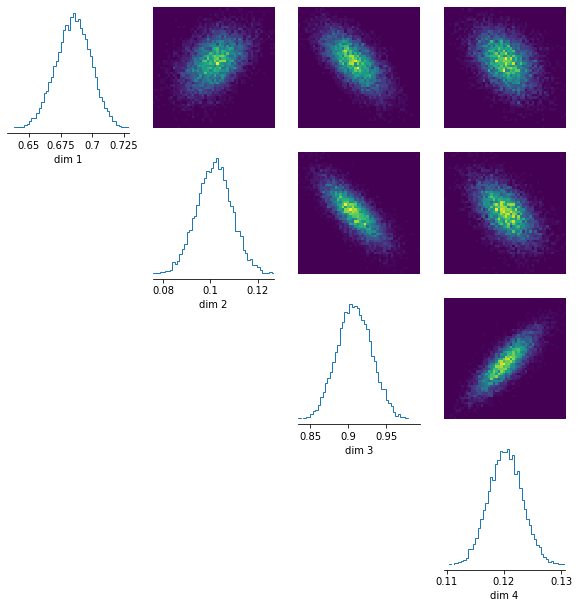

In [29]:
samples = posterior.sample((10000,))
pairplot(samples)

In [30]:
c2st(samples, ref_samples)



Loss: 10.42:  60%|█████▉    | 1198/2000 [00:43<00:19, 41.60it/s]

tensor([0.8697])

(<Figure size 720x720 with 16 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb6600c87d0>,
       dtype=object))

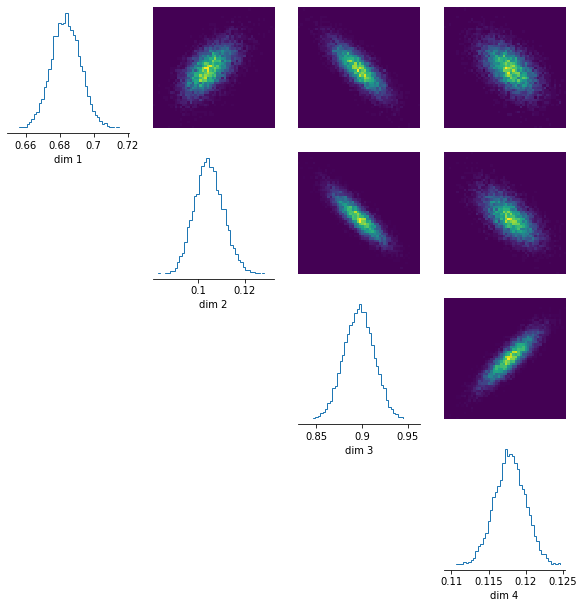

In [13]:
ref_samples = task.get_reference_posterior_samples(1)
pairplot(samples)

In [2]:
# Loads a model...
def get_model(task_name):
    task = sbibm.get_task(task_name) 
    prior = task.prior_dist
    simulator = task.get_simulator()
    observation = task.get_observation(num_observation=1) 

    thetas = prior.sample((10000,))
    xs = simulator(thetas)


    inf = inference.SNLVI(prior)
    density_estimator = inf.append_simulations(thetas, xs).train(max_num_epochs=0)
    state_dict = torch.load(f"scripts/likelihood_models/{task_name}.net")
    density_estimator = inf._neural_net
    density_estimator.load_state_dict(state_dict())
    return inf, task

In [42]:
inf, task = get_model("slcp")

## 1) Forward KL divergence

In variational inference we typically minimize backward divergences because it requires to only sample from the variational posterior not the intractable posterior. Nonetheless these has several shortcommings:
* The backward KL divergence has a mode seeking property, hence often leads to mode collapse.
* We approximate expectation through Monte Carlo estimates based on sample from the variational distribution, hence if it collapse it will most likely stay collapsed.

The first point can be effectively handeled with imporatnce weighted elbo particles as in the IWelbo or renjey divergences. The second point cannot be handeled in this way, because we still use sample from the variational distribution!

Lets consider the case to minimize the forward KL divergence.
$$ D_{KL}(p(\theta|x)||q_\phi(\theta)) = \mathbb{E}_p \left[ \log \frac{p(\theta|x)}{q_\phi(\theta)}\right] = -\mathbb{E}_p[\log q_\phi(\theta)] + const$$

We cannot use naive Monte carlo estimates as we cannot sample from the true posterior, however, we can use importance sampling estimator for this expectation.
$$ \mathbb{E}_p[\log q_\phi(\theta)] = \int \log q_\phi(\theta) p(\theta|x) d\theta = \frac{1}{p(x)} \int \log q_\phi(\theta) \frac{p(\theta,x)}{q_{IW}(\theta)} q_{IW}(\theta)d\theta =  \frac{1}{p(x)} \mathbb{E}_{q_{IW}}\left[ \log q_\phi(\theta) \frac{p(\theta,x)}{q_{IW}(\theta)} \right]$$
Where $q_{IW}$ is an arbitrary proposal distributions. As the evidence is also unknow we can estimate again using IS leading to a self normalized imporatnce sampling algorithm. Be $\theta_1, \dots, \theta_M \sim q_IW$ we obtain
$$ w(\theta_i) = \frac{\frac{p(\theta_i,x)}{q_{IW}(\theta_i)}}{\sum_{i=1}^M\frac{p(\theta_i,x)}{q_{IW}(\theta_i)}} $$
Hence we get 
$$\mathbb{E}_p[\log q_\phi(\theta)]  \approx \sum_{i=1}^M w(\theta_i)\log q_\phi(\theta_i) = \hat{\mu}$$

This estimator is **consistent** however it is slightly biased. One big advantage of this approach is that we can actually choose the proposal $q_{IW}$ as we want. However one general problem is the variance which can be estimated by $ \sum_{i=1}^M w(\theta_i)^2 (\log q_\phi(\theta_i) - \hat{\mu})$. Hence the weights which lead to minimial variance satisfy $\min \sum_{i=1}^M w(\theta_i)^2 s.t. \sum_{i=1}^M w(\theta_i) = 1$, which has solution $w(\theta_i) = \frac{1}{M}$, it follows that $\frac{p(\theta_i,x)}{q_{IW}(\theta_i)} = C \Rightarrow q_{IW} \propto p(\theta,x) \propto p(\theta|x)$. This suggests the variaitonal posterior $q_\phi$ as good choice in the later iterations. However in early iterations this can be rather bad and greatly depends how $q_\phi$ is initialized. There is not obvious "good" choice, hence one can just use the prior.

All in all we obtain a loss
$$ \mathcal{L}(\phi) = D_{KL}(p(\theta|x)||q_\phi(\theta)) = -\mathbb{E}_p[\log q_\phi(\theta)] + const \approx \hat{\mu} + const$$

The effective sample size of $M$ importance samples, roughly approximating the number of independent and identically distributed i.i.d samples can be computed by
$$ESS = \frac{M}{(1+Var_{q_{IW}}(w(\theta))/\mathbb{E}_{q_{IW}}[\theta]**2)}$$

In [86]:
posterior = inf.build_posterior(flow="spline_autoregressive")
posterior.set_default_x(task.get_observation(1))
x_obs = task.get_observation(1)
q = posterior.q


In [115]:
samples = q.sample((100,))

In [116]:
q.clear_cache()
logq = q.log_prob(samples)
logp = posterior.net.log_prob(x_obs.repeat(100,1), samples) + posterior._prior.log_prob(samples)
logweights = logp-logq
weights = logweights.softmax(0).detach()
loss = torch.mean((logq)*weights)
torch.autograd.grad(loss, q.parameters())[0][:2]

tensor([[ 0.0000e+00,  9.5046e-05,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0832e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00]])

In [102]:
weights

tensor([1.3563e-22, 0.0000e+00, 0.0000e+00, 8.6276e-06, 3.3490e-15, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 6.1734e-11, 9.1306e-26, 0.0000e+00, 2.5082e-29,
        0.0000e+00, 0.0000e+00, 7.0442e-37, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 4.2812e-19, 0.0000e+00, 2.1693e-15, 0.0000e+00, 5.7593e-03,
        5.9342e-06, 3.3590e-03, 6.8541e-11, 2.6813e-39, 5.5266e-02, 8.0688e-02,
        0.0000e+00, 6.6674e-07, 0.0000e+00, 2.2658e-17, 0.0000e+00, 0.0000e+00,
        8.7775e-11, 0.0000e+00, 0.0000e+00, 1.8478e-10, 1.7358e-01, 8.4715e-05,
        2.2800e-34, 2.2128e-33, 8.7736e-24, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 2.6124e-07, 0.0000e+00, 0.0000e+00, 0.0000e+00, 3.2117e-12,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 2.5581e-24, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 9.6962e-06, 3.4258e-23, 0.0000e+00, 2.7774e-20,
        0.0000e+00, 0.0000e+00, 9.7057e-22, 2.2130e-07, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 2.1797e-07, 0.0000e+

In [75]:
optimizer = torch.optim.Adam(posterior.q.parameters(),lr=1e-3)
x_obs = task.get_observation(1).repeat(1024,1)
alpha = 0.1
losses = []
for i in range(100):
    optimizer.zero_grad()
    proposal = posterior.q
    #proposal = posterior._prior
    samples = proposal.sample((512,))
    #samples = proposal.rsample((512,))
    x_obs = task.get_observation(1).repeat(512,1)
    #posterior.q.clear_cache()
    logq = posterior.q.log_prob(samples)
    logp = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)
    #with torch.no_grad():
        #logweights = logp -proposal.log_prob(samples)
    logweights = logp-logq
    #logweights = torch.clamp_max(logweights, logweights.quantile(0.8))
    weights = logweights.softmax(0).detach()
    

    kl_f = ((logp-logq)*weights)
    kl_f.mean().backward()
    losses.append([kl_f.mean().detach()])
    optimizer.step()

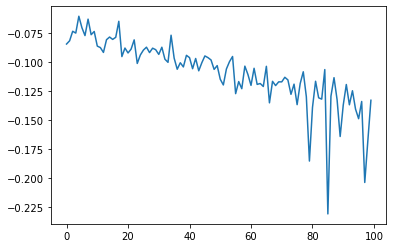

In [76]:
plt.plot(losses)

(<Figure size 720x720 with 25 Axes>,
 array([[<AxesSubplot:xlabel='dim 1'>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:xlabel='dim 2'>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:xlabel='dim 3'>,
         <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:xlabel='dim 4'>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:xlabel='dim 5'>]], dtype=object))

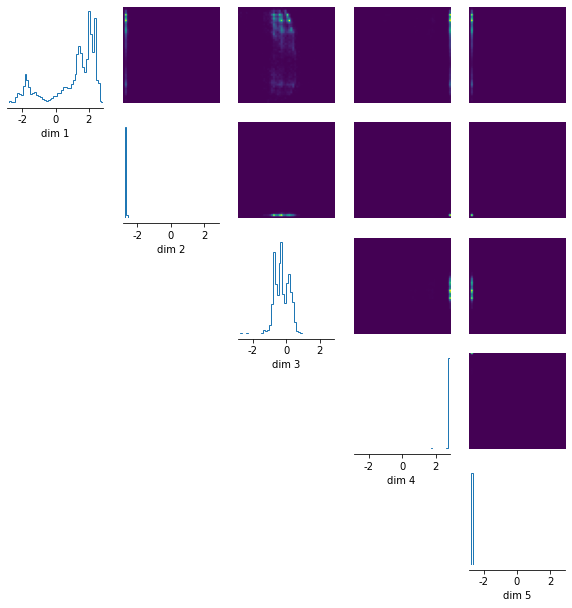

In [77]:
pairplot(posterior.sample((10000,)))

In [ ]:
proposal = posterior.q
#proposal = posterior._prior
samples = proposal.sample((512,))
x_obs = task.get_observation(1).repeat(512,1)
posterior.q.clear_cache()
logq = posterior.q.log_prob(samples)
logp = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)
#with torch.no_grad():
    #logweights = logp -proposal.log_prob(samples)
logweights = logp-logq
weights = logweights.softmax(0).detach()

kl_f = ((logp-logq)*weights)

In [5]:
posterior.train(loss="elbo", learning_rate=1e-3)

Loss: 29.29:  27%|██▋       | 549/2000 [00:12<00:34, 42.42it/s]
Converged with loss: 29.299999237060547


KeyboardInterrupt: 

In [18]:
from sbibm.metrics import c2st, ksd, mvn_kl_qp
#ksd(task, 1, posterior.sample((10000,)))

ImportError: cannot import name 'mvn_kl_qp' from 'sbibm.metrics' (D:\Anaconda3\lib\site-packages\sbibm\metrics\__init__.py)

In [64]:
posterior.sample = lambda self,shape: self.sample(shape, method="ir")

In [54]:
from functools import partial 
posterior.sample =partial(posterior.sample, method="imh", method_params={"T":1000})

In [72]:
class Wrapper():
    def sample(self, shape):
        return posterior.sample(shape, method="imh", method_params={"T":100})
Wrapper().sample((100,))

tensor([[-2.2272e-01,  8.7782e-01,  2.7033e-01, -8.5638e-01, -1.7493e-01,
          4.2091e-01, -1.2780e-01, -6.9893e-01,  8.8249e-01, -1.6766e-01],
        [ 1.8651e+00, -2.6535e-01,  1.0307e+00, -5.0214e-01, -1.6643e+00,
         -2.2805e+00, -1.5778e+00,  2.4866e-01,  7.2163e-01,  1.2236e-01],
        [-1.6331e-01,  1.4184e+00,  1.3661e+00,  1.6686e+00,  1.5099e+00,
          5.1015e-01, -4.8996e-01,  2.2115e-01,  2.3687e-01,  8.3379e-01],
        [ 4.1274e-01,  3.8794e-01, -6.7878e-01,  2.4019e-01,  1.3608e-01,
         -1.1356e+00, -1.6349e+00,  3.1335e-01, -7.8870e-02,  4.8534e-01],
        [-6.7596e-02,  1.1085e+00,  1.3454e+00,  6.7110e-01,  8.2972e-01,
          4.8389e-01, -4.4035e-01, -6.3641e-01, -1.0327e+00, -6.3278e-01],
        [ 4.3069e-01, -1.0933e-01,  1.3347e+00,  8.5991e-01, -2.2372e-01,
         -1.1165e-01, -1.3107e+00, -8.5632e-01,  3.5743e-01,  6.0952e-02],
        [-5.4799e-01, -6.2253e-01, -3.1183e-01,  1.1913e+00, -4.3596e-01,
         -7.2954e-01, -4.8181e-0

In [16]:
mvn_kl(posterior.sample((10000,)), ref_samples)

TypeError: 'module' object is not callable

In [9]:
torch.save(posterior, "test")

In [10]:
posterior = torch.load("test")

In [12]:
posterior.sample()

tensor([ 0.5881,  1.9457,  3.5527,  2.4288,  0.0523, -1.4537, -2.5450, -2.0893,
        -0.7461,  0.1134])

In [14]:
from sbibm.metrics import c2st
ref_samples = task.get_reference_posterior_samples(1)

In [10]:
samples = posterior.sample((10000,))
c2st(samples, ref_samples)

NameError: name 'ref_samples' is not defined

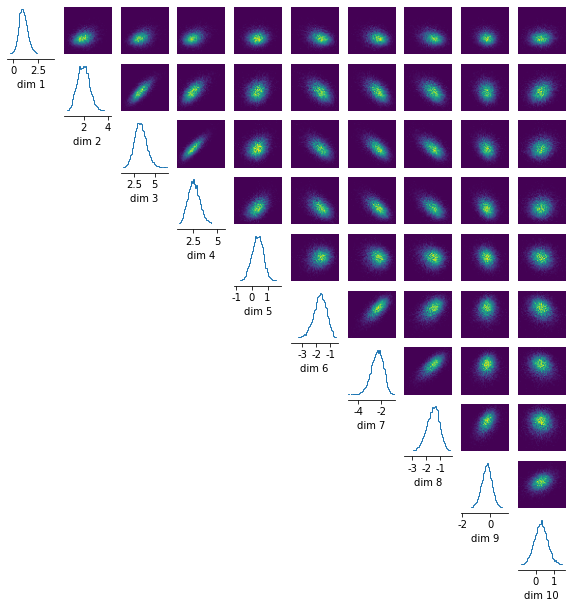

In [15]:
samples = posterior.sample((10000,))
_ = pairplot(samples)

Alternative using IRS

In [100]:
posterior = inf.build_posterior()
posterior.set_default_x(task.get_observation(1))
x_obs = task.get_observation(1)

In [103]:
optimizer = torch.optim.Adam(posterior.q.parameters(),lr=1e-3)
x_obs = task.get_observation(1).repeat(1024,1)
alpha = 0.1
for i in range(200):
    optimizer.zero_grad()
    samples = posterior.q.rsample((1024,))
    #posterior.q.clear_cache()
    logq = posterior.q.log_prob(samples)
    logp = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)
    elbo_particles = logp-logq
    mean_particles = torch.logsumexp(elbo_particles*(1-alpha)- np.log(1024),0)
    loss = -torch.exp(mean_particles)
    print(loss)
    loss.backward()
    optimizer.step()

tensor(-0.7629, grad_fn=<NegBackward>)
tensor(-0.4666, grad_fn=<NegBackward>)
tensor(-0.2906, grad_fn=<NegBackward>)
tensor(-0.4610, grad_fn=<NegBackward>)
tensor(-0.2020, grad_fn=<NegBackward>)
tensor(-0.2738, grad_fn=<NegBackward>)
tensor(-0.4352, grad_fn=<NegBackward>)
tensor(-0.3259, grad_fn=<NegBackward>)
tensor(-0.3870, grad_fn=<NegBackward>)
tensor(-0.5644, grad_fn=<NegBackward>)
tensor(-0.1199, grad_fn=<NegBackward>)
tensor(-0.1234, grad_fn=<NegBackward>)
tensor(-0.2067, grad_fn=<NegBackward>)
tensor(-0.1100, grad_fn=<NegBackward>)
tensor(-0.3243, grad_fn=<NegBackward>)
tensor(-0.1329, grad_fn=<NegBackward>)
tensor(-0.4355, grad_fn=<NegBackward>)
tensor(-0.2089, grad_fn=<NegBackward>)
tensor(-0.0958, grad_fn=<NegBackward>)
tensor(-0.1023, grad_fn=<NegBackward>)
tensor(-0.3492, grad_fn=<NegBackward>)
tensor(-0.4455, grad_fn=<NegBackward>)
tensor(-0.4880, grad_fn=<NegBackward>)
tensor(-0.4958, grad_fn=<NegBackward>)
tensor(-0.2953, grad_fn=<NegBackward>)
tensor(-0.1884, grad_fn=<

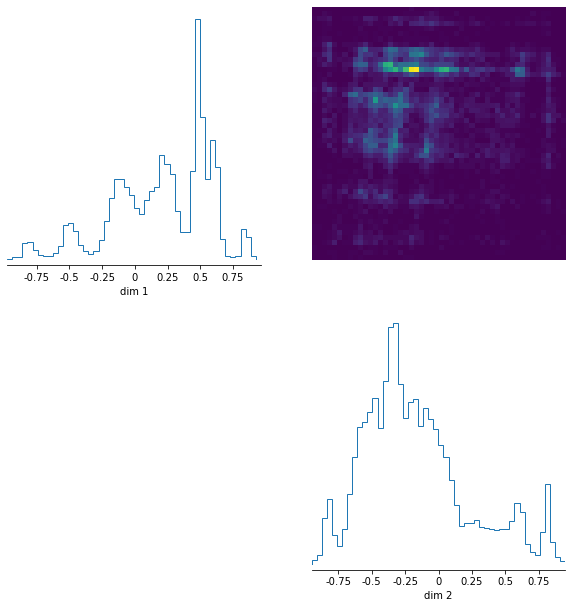

In [104]:
samples = posterior.sample((10000,))
_ = pairplot(samples)

# 2) Pertubabtion VI

Variaitonal inference is equivalent to maximizing a lower bound on the marginal likelihood. Notice that we can always write the exact marginal likelihood as 
$$ p(x) = \int p(x,\theta)d\theta = \int \frac{p(x,\theta)}{q(\theta)}q(\theta)d\theta = \mathbb{E}_q\left[\frac{p(x,\theta)}{q(\theta)}\right] = \mathbb{E}_q\left[w(\theta)\right]$$
where we call $w$ an importance ratio. Hence this is an **importance sampling** estimate, which however often suffer from **high variance** in high dimensions. Hence we may use an lower-bound as in variational inference. Be $f$ any concave function, we can lower bound the marginal likelihood 
$$ p(x) \geq f(p(x)) \geq \mathbb{E}_q[f(w(\theta))] $$

For $f=id$ we obtain importance sampling, which suffers from high variance but is unbiased. For $f=\log$ we obtain a KL divergence, which has low variance but is biased.

Pertubation VI performs a taylor expansion around $w_0$ for $f(w(\theta))$.
$$ f_{w_0}^K(\theta) = e^{-w_0} \sum_{k=1}^K \frac{(w_0 - \log w(\theta))}{k!}$$

In [123]:
import math

In [175]:
posterior = inf.build_posterior()
posterior.set_default_x(task.get_observation(1))
observation = task.get_observation(1)

In [176]:
V_0 = torch.zeros(1, requires_grad=True)

In [177]:
optimizer = torch.optim.Adam(list(posterior.q.parameters()) + [V_0],lr=1e-2)
lr_lambda = lambda epoch: 0.995
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda, last_epoch=-1, verbose=False)
K = 3

In [182]:
x_obs = observation.repeat(128,1)
for i in range(1000):
    optimizer.zero_grad()
    samples = posterior.q.rsample((128,))
    logp = posterior.net.log_prob(x_obs,samples) + posterior._prior.log_prob(samples)
    logq = posterior.q.log_prob(samples)
    loss = 0
    for k in range(K+1):
        loss = loss + torch.pow((V_0 + logp - logq), k).mean()/math.factorial(k)

    loss = -loss* torch.exp(-V_0)
    print(loss)

    loss.backward()
    optimizer.step()
    #scheduler.step()

tensor([0.2722], grad_fn=<MulBackward0>)
tensor([0.0302], grad_fn=<MulBackward0>)
tensor([0.2678], grad_fn=<MulBackward0>)
tensor([0.2182], grad_fn=<MulBackward0>)
tensor([0.0403], grad_fn=<MulBackward0>)
tensor([65.5014], grad_fn=<MulBackward0>)
tensor([131.3734], grad_fn=<MulBackward0>)
tensor([0.0472], grad_fn=<MulBackward0>)
tensor([0.0576], grad_fn=<MulBackward0>)
tensor([0.0594], grad_fn=<MulBackward0>)
tensor([-0.0366], grad_fn=<MulBackward0>)
tensor([-0.0025], grad_fn=<MulBackward0>)
tensor([0.1000], grad_fn=<MulBackward0>)
tensor([63.7706], grad_fn=<MulBackward0>)
tensor([0.3481], grad_fn=<MulBackward0>)
tensor([0.0123], grad_fn=<MulBackward0>)
tensor([-0.0065], grad_fn=<MulBackward0>)
tensor([-0.0061], grad_fn=<MulBackward0>)
tensor([-0.0191], grad_fn=<MulBackward0>)
tensor([0.0394], grad_fn=<MulBackward0>)
tensor([-0.0249], grad_fn=<MulBackward0>)
tensor([54.0253], grad_fn=<MulBackward0>)
tensor([0.0069], grad_fn=<MulBackward0>)
tensor([-0.0288], grad_fn=<MulBackward0>)
tens

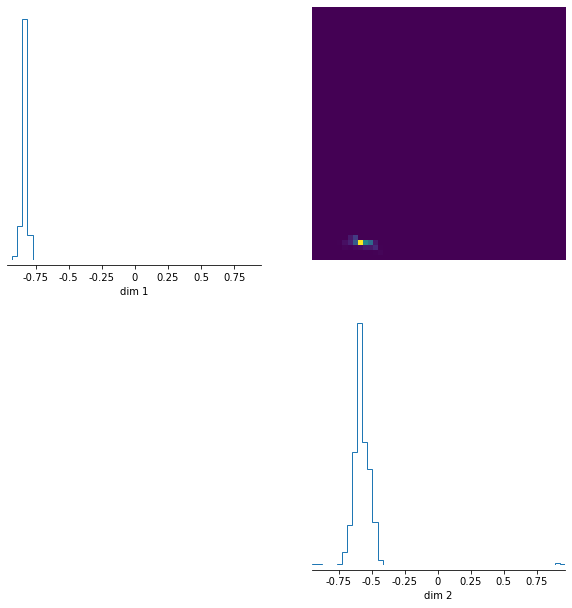

In [183]:
samples = posterior.sample((10000,))
_ = pairplot(samples)

## 3) Variational boosting

This is a technique to iteratively learn a mixture distribution as variational family!



In [116]:
posterior = inf.build_posterior()
posterior.set_default_x(task.get_observation(1))
observation = task.get_observation(1)

In [16]:
from sbi.vi.mixture_of_flows import Mixture
from sbi.vi.build_q import build_q

In [24]:
torch.sigmoid

<function _VariableFunctionsClass.sigmoid>

In [1]:
K = 4
qs = []
mix = torch.ones(K)
x_obs = task.get_observation(1).repeat(128,1)
for k in range(K):
    q = build_q(posterior._prior.event_shape, posterior._prior.support, num_flows=2)
    if k > 0:
        new_pi = torch.logit(torch.tensor([1/(k+1)]))
        mix_k = torch.tensor(new_pi, requires_grad=True)
        optimizer = torch.optim.Adam(list(q.parameters()), lr=1e-2)
        optimizer_mix = torch.optim.Adam([mix_k], lr=1e-1)
        mixture_dist = torch.distributions.Categorical(mix[:k])
        old_q = Mixture(mixture_dist, qs)
        for p in old_q.parameters():
            p.detach()
    else:
        optimizer = torch.optim.Adam(list(q.parameters()), lr=1e-2)
        mix_k = torch.ones(1)
    qs.append(q)

    for i in range(300):
        optimizer.zero_grad()
        samples = q.rsample((128,))
        logp = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)
        if k == 0:
            logq = q.log_prob(samples)
            loss = -torch.mean(logp-logq)
        else:
            optimizer_mix.zero_grad()
            samples_old = old_q.sample((128,))
            logp_old = posterior.net.log_prob(x_obs, samples_old) + posterior._prior.log_prob(samples_old)
            logq_old = old_q.log_prob(samples) 
            logq_new = q.log_prob(samples)
            logq_old_old = old_q.log_prob(samples_old) 
            logq_new_old = q.log_prob(samples_old)
            pi = torch.sigmoid(mix_k)
            logq = torch.log((1-pi)*logq_old.exp() + pi*logq_new.exp())
            logq_old = torch.log((1-pi)*logq_old_old.exp() +pi*logq_new_old.exp())
            loss = -(1-pi)*torch.mean(logp_old-logq_old) - pi*torch.mean(logp-logq)

        loss.backward()
        optimizer.step()
        print(loss)
        if k > 0:
            optimizer_mix.step()
    if k > 0:
        with torch.no_grad():
            mix[k] = torch.sigmoid(mix_k)
            mix[:k] = mix[:k]*(1-mix[k])
    print(mix)
final_mix = torch.distributions.Categorical(mix) 
final_q = Mixture(final_mix, qs)

NameError: name 'torch' is not defined

In [137]:
posterior.q = final_q           
posterior.train(n_particles=128, loss="elbo")

Loss: 0.84:   4%|▍         | 84/2000 [00:26<10:04,  3.17it/s]


KeyboardInterrupt: 

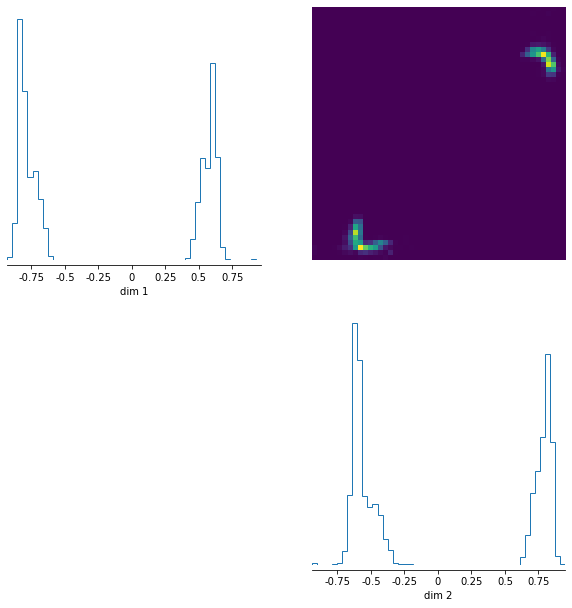

In [138]:
samples = final_q.sample((10000,))
_ = pairplot(samples)

## 2) Symmetric KL divergence 

This divergence combines both the the forward and reverse KL divergence and is given by 
$$ D_{SymKL} = \frac{1}{2} D_{KL}(p(\theta|x)||q_\phi(\theta)) + \frac{1}{2} D_{KL}(q_\phi(\theta)||p(\theta|x)) = \frac{1}{2} \mathbb{E}_p \left[ \log \frac{p(\theta|x)}{q_\phi(\theta)}\right] + \frac{1}{2} \mathbb{E}_{q_\phi} \left[ \log \frac{q_\phi(\theta)}{p(\theta|x)}\right] $$
$$ = \frac{1}{2} (\mathbb{E}_p \left[ \log \frac{p(\theta,x)}{q_\phi(\theta)}\right]  - \log p(x)) + \frac{1}{2} (\mathbb{E}_{q_\phi} \left[ \log \frac{q_\phi(\theta)}{p(\theta,x)} \right] + \log p(x) ) =  \frac{1}{2} \mathbb{E}_p \left[ \log \frac{p(\theta,x)}{q_\phi(\theta)}\right] -  \frac{1}{2} \mathbb{E}_{q_\phi} \left[ \log \frac{p(\theta,x)}{q_\phi(\theta)} \right] $$
The first term can be approximated as before the second term is just the elbo!

In [121]:
posterior = inf.build_posterior()
posterior.set_default_x(task.get_observation(1))

VariationalPosterior(
               method_family=snle,
               net=<a Flow, see `.net` for details>,
               prior=Independent(Uniform(low: torch.Size([2]), high: torch.Size([2])), 1),
               x_shape=torch.Size([1, 2]))
               

In [122]:
optimizer = torch.optim.Adam(posterior.q.parameters(),lr=1e-2)
alpha = 1.
for i in range(200):
    optimizer.zero_grad()
    #mix = Categorical(probs=torch.tensor([alpha, 1-alpha]))
    #proposal = Mixture(mix, [posterior._prior, posterior.q])
    proposal = posterior.q
    #proposal = posterior._prior
    samples = proposal.sample((512,))
    x_obs = task.get_observation(1).repeat(512,1)
    posterior.q.clear_cache()
    logq = posterior.q.log_prob(samples)
    logp = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)
    #with torch.no_grad():
        #logweights = logp -proposal.log_prob(samples)
    logweights = logp-logq
    weights = logweights.softmax(0).detach()
    
    kl_f = ((logp-logq)*weights)

    # Backward KL
    x_obs = task.get_observation(1).repeat(128,1)
    particles = posterior.q.rsample((128,))
    kl_b = posterior.net.log_prob(x_obs, particles) + posterior._prior.log_prob(particles)-posterior.q.log_prob(particles)
    # # Combined loss
    loss = 0.9*kl_f.sum() - 0.1*kl_b.mean()
    print(loss)
    loss.backward()
    optimizer.step()

tensor(9.5594, grad_fn=<SubBackward0>)
tensor(9.3492, grad_fn=<SubBackward0>)
tensor(4.5897, grad_fn=<SubBackward0>)
tensor(3.8485, grad_fn=<SubBackward0>)
tensor(1.3003, grad_fn=<SubBackward0>)
tensor(6.8887, grad_fn=<SubBackward0>)
tensor(2.7621, grad_fn=<SubBackward0>)
tensor(3.8400, grad_fn=<SubBackward0>)
tensor(3.2593, grad_fn=<SubBackward0>)
tensor(2.6141, grad_fn=<SubBackward0>)
tensor(2.4565, grad_fn=<SubBackward0>)
tensor(1.9200, grad_fn=<SubBackward0>)
tensor(4.7003, grad_fn=<SubBackward0>)
tensor(2.4415, grad_fn=<SubBackward0>)
tensor(1.8020, grad_fn=<SubBackward0>)
tensor(2.3007, grad_fn=<SubBackward0>)
tensor(3.0029, grad_fn=<SubBackward0>)
tensor(1.9685, grad_fn=<SubBackward0>)
tensor(1.9888, grad_fn=<SubBackward0>)
tensor(1.4969, grad_fn=<SubBackward0>)
tensor(2.1722, grad_fn=<SubBackward0>)
tensor(3.3214, grad_fn=<SubBackward0>)
tensor(1.9290, grad_fn=<SubBackward0>)
tensor(1.8377, grad_fn=<SubBackward0>)
tensor(5.1728, grad_fn=<SubBackward0>)
tensor(3.8813, grad_fn=<S

In [9]:
samples = posterior.sample((10000,))
_ = pairplot(samples)

NameError: name 'posterior' is not defined

# Stein variational decent

In [14]:
posterior = inf.build_posterior(flow="spline_autoregressive")
posterior.set_default_x(task.get_observation(1))
x_obs = task.get_observation(1)

In [15]:
kernel_function = lambda x,y,h=1: torch.exp(-0.5*torch.cdist(x,y)**2/h**2)

In [16]:
potential_function = lambda theta: posterior.net.log_prob(x_obs.repeat(theta.shape[0],1), theta) + posterior._prior.log_prob(theta)

In [17]:
class DAE(torch.nn.Module):
    def __init__(self,input_dim, h, hidden_dim=20, sigma=0.01, link = lambda x: torch.sigmoid(x)*2-1.):
        super().__init__()
        self.input_dim = input_dim
        self.sigma=sigma
        self.link = link
        self.encoder = torch.nn.Sequential(torch.nn.Linear(input_dim, hidden_dim), torch.nn.Tanh(),torch.nn.Linear(hidden_dim, hidden_dim), torch.nn.Tanh(),torch.nn.Linear(hidden_dim, hidden_dim), torch.nn.Tanh(),torch.nn.Linear(hidden_dim, h), torch.nn.Sigmoid())
        self.decoder = torch.nn.Sequential(torch.nn.Linear(h, hidden_dim), torch.nn.Tanh(), torch.nn.Linear(hidden_dim, input_dim))
        self.noise_distribution = torch.distributions.Normal(torch.zeros(input_dim), torch.ones(input_dim)*sigma)

    def forward(self,x):
        x = x.reshape(-1,self.input_dim)
        h = self.encoder(x)
        x_out = self.decoder(h)
        x_out = self.link(x_out)
        return x_out 

    def score(self,x):
        x_rec = self.forward(x)
        return (x_rec-x)/model.sigma#**2


In [18]:
from torch.utils.data import Dataset, DataLoader

(-100.0, 100.0)

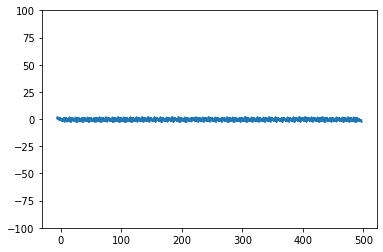

In [50]:
p = torch.distributions.Independent(torch.distributions.Normal(torch.arange(50).float()*10,torch.ones(50)*2),0)
#p = torch.distributions.TransformedDistribution(p0,[torch.distributions.transforms.SigmoidTransform(), torch.distributions.transforms.PowerTransform(0.5), torch.distributions.transforms.SigmoidTransform().inv])
samples = p.sample((1000,))
samples.requires_grad = True
logp = p.log_prob(samples)
dlogp = torch.autograd.grad(logp,samples, torch.ones(logp.shape),only_inputs=True)[0]
plt.scatter(samples.detach(), dlogp.detach(),s=1)
plt.ylim(-100,100)

In [52]:
samples = p.sample((10000,))
data_loader = DataLoader(samples, shuffle=True, batch_size=1000)
model = DAE(50,40, hidden_dim=100, sigma=0.1, link= lambda x:x)

In [54]:
optimizer = torch.optim.Adam(model.parameters(),lr=1e-2)
loss_f = torch.nn.MSELoss()
for i in range(100):
    for x in data_loader:
        optimizer.zero_grad()
        noise = model.noise_distribution.sample((x.shape[0],))
        x_n = x + noise
        x_rec = model(x_n)
        loss = loss_f(x,x_rec)
        loss.backward()
        optimizer.step()
    print(loss)

tensor(4.5468, grad_fn=<MseLossBackward>)
tensor(4.4110, grad_fn=<MseLossBackward>)
tensor(4.1207, grad_fn=<MseLossBackward>)
tensor(4.1217, grad_fn=<MseLossBackward>)
tensor(4.0283, grad_fn=<MseLossBackward>)
tensor(3.9878, grad_fn=<MseLossBackward>)
tensor(4.0097, grad_fn=<MseLossBackward>)
tensor(3.9717, grad_fn=<MseLossBackward>)
tensor(4.0137, grad_fn=<MseLossBackward>)
tensor(3.9925, grad_fn=<MseLossBackward>)
tensor(3.9510, grad_fn=<MseLossBackward>)
tensor(4.0089, grad_fn=<MseLossBackward>)
tensor(4.0375, grad_fn=<MseLossBackward>)
tensor(4.0045, grad_fn=<MseLossBackward>)
tensor(3.9649, grad_fn=<MseLossBackward>)
tensor(4.0376, grad_fn=<MseLossBackward>)
tensor(4.0338, grad_fn=<MseLossBackward>)
tensor(4.0043, grad_fn=<MseLossBackward>)
tensor(4.0053, grad_fn=<MseLossBackward>)
tensor(4.0116, grad_fn=<MseLossBackward>)
tensor(3.9607, grad_fn=<MseLossBackward>)
tensor(3.9899, grad_fn=<MseLossBackward>)
tensor(3.9999, grad_fn=<MseLossBackward>)
tensor(4.0431, grad_fn=<MseLossBac

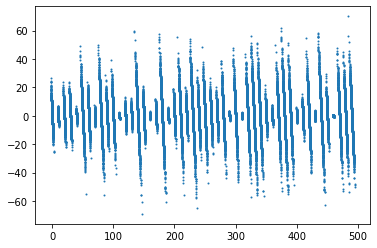

In [43]:
samples = p.sample((1000,))
plt.scatter(samples, model.score(samples).detach(), s=1)

In [46]:
N = 1000
x = torch.randn(N,50)
eps = 5.
h = 1
for i in range(1000):
    x = x.clone().detach()
    x.requires_grad=True
    #logp = posterior.net.log_prob(x_obs.repeat(x.shape[0],1), x) + posterior._prior.log_prob(x)
    #dlogp = torch.autograd.grad(logp,x, torch.ones(logp.shape),only_inputs=True)[0]
    dlogp = model.score(x)

    K = kernel_function(x,x, h=h)
    dK = -K@x 
    sumK = K.sum(1)
    for i in range(x.shape[1]):
        dK[:,i] = dK[:,i] + x[:,i]*sumK 
    dK /= h**2

    phi_x = 1/N*(K@dlogp + dK)
    x = x + eps*phi_x
    #print(x[0])

KeyboardInterrupt: 

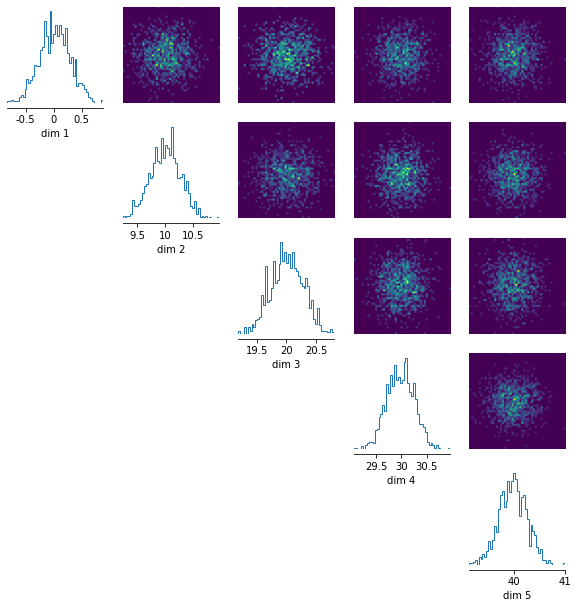

In [47]:
_ = pairplot(x[:,:5].detach().numpy())

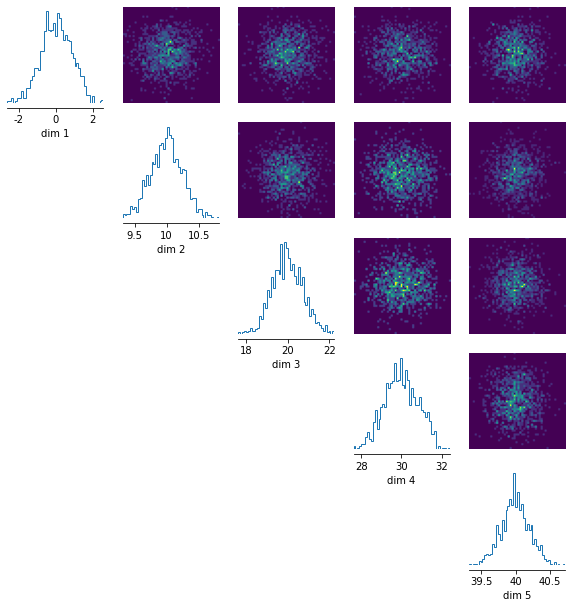

In [48]:
_ = pairplot(samples[:,:5].detach())

In [138]:
from sbibm.algorithms.sbi.utils import wrap_posterior, wrap_prior_dist, wrap_simulator_fn

In [139]:
transforms = torch.distributions.transforms.ComposeTransform([torch.distributions.transforms.AffineTransform(loc=0.5*torch.ones(2), scale=0.5*torch.ones(2)), torch.distributions.SigmoidTransform().inv]) 

In [303]:
prior = task.get_prior_dist()
simulator = task.get_simulator() 

# prior = wrap_prior_dist(prior, transforms)
# simulator = wrap_simulator_fn(simulator,transforms)

thetas = prior.sample((50000,))
xs = simulator(thetas)

data = [torch.hstack([thetas[i], xs[i]]) for i in range(len(thetas))]
data_loader = DataLoader(data, shuffle=True, batch_size=1000)
model = DAE(4,200, hidden_dim=200, sigma=0.0005)

In [304]:
thetas = prior.sample((10000,))
xs = simulator(thetas)

data = [torch.hstack([thetas[i], xs[i]]) for i in range(len(thetas))]
data_loader_validation = DataLoader(data, shuffle=True, batch_size=10000)

In [305]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-2)
loss_f = torch.nn.MSELoss()

In [306]:
for i in range(1000):
    for x in data_loader:
        optimizer.zero_grad()
        noise = model.noise_distribution.sample((x.shape[0],))
        x_n = x + noise
        x_rec = model(x_n)
        loss = loss_f(x,x_rec)
        loss.backward()
        optimizer.step()
    for x in data_loader_validation:
        noise = model.noise_distribution.sample((x.shape[0],))
        x_n = x + noise
        x_rec = model(x_n)
        loss = loss_f(x,x_rec)
        print("Validation Loss:", loss)

Validation Loss: tensor(0.0063, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0028, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0022, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0019, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0017, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0013, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0012, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0011, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0011, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0011, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0010, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0011, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0010, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0010, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0010, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0009, grad_fn=<MseLossBackward>)
Validation Loss: tensor(0.0009, grad_fn=<MseLossBackward

KeyboardInterrupt: 

In [309]:
N = 1000
x = prior.sample((N,))
eps = 0.001
h = 0.1
x_obs = task.get_observation(1)
for i in range(2000):
    x = x.clone().detach()
    x.requires_grad=True
    #logp = posterior.net.log_prob(x_obs.repeat(x.shape[0],1), x) + posterior._prior.log_prob(x)
    #dlogp = torch.autograd.grad(logp,x, torch.ones(logp.shape),only_inputs=True)[0]
    dlogp = model.score(torch.hstack((x, x_obs.repeat(x.shape[0],1))))[:,:2]

    K = kernel_function(x,x, h=h)
    dK = -K@x 
    sumK = K.sum(1)
    for i in range(x.shape[1]):
        dK[:,i] = dK[:,i] + x[:,i]*sumK 
    dK /= h**2

    phi_x = 1/N*(K@dlogp + dK)
    x = x + eps*phi_x
    print(x[0])

tensor([-0.4443, -0.5380], grad_fn=<SelectBackward>)
tensor([-0.4445, -0.5388], grad_fn=<SelectBackward>)
tensor([-0.4446, -0.5397], grad_fn=<SelectBackward>)
tensor([-0.4448, -0.5405], grad_fn=<SelectBackward>)
tensor([-0.4450, -0.5413], grad_fn=<SelectBackward>)
tensor([-0.4451, -0.5422], grad_fn=<SelectBackward>)
tensor([-0.4453, -0.5430], grad_fn=<SelectBackward>)
tensor([-0.4455, -0.5438], grad_fn=<SelectBackward>)
tensor([-0.4457, -0.5446], grad_fn=<SelectBackward>)
tensor([-0.4458, -0.5454], grad_fn=<SelectBackward>)
tensor([-0.4460, -0.5463], grad_fn=<SelectBackward>)
tensor([-0.4462, -0.5471], grad_fn=<SelectBackward>)
tensor([-0.4464, -0.5479], grad_fn=<SelectBackward>)
tensor([-0.4465, -0.5487], grad_fn=<SelectBackward>)
tensor([-0.4467, -0.5495], grad_fn=<SelectBackward>)
tensor([-0.4469, -0.5503], grad_fn=<SelectBackward>)
tensor([-0.4471, -0.5511], grad_fn=<SelectBackward>)
tensor([-0.4472, -0.5519], grad_fn=<SelectBackward>)
tensor([-0.4474, -0.5527], grad_fn=<SelectBack

KeyboardInterrupt: 

(<Figure size 720x720 with 4 Axes>,
 array([[<AxesSubplot:xlabel='dim 1'>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:xlabel='dim 2'>]], dtype=object))

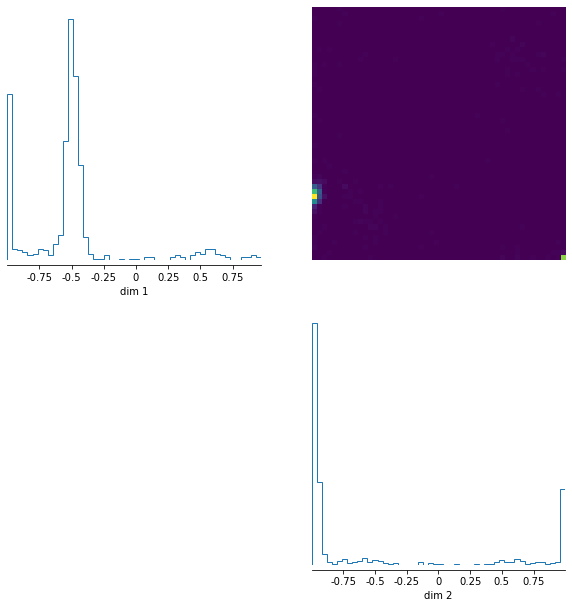

In [311]:
pairplot(x.detach()[prior.support.check(x)])

In [137]:
theta_test = thetas[0].reshape(-1,2)
joint = torch.hstack((theta_test, xs[0].reshape(-1,2)))
print(joint)
denoise_joint = model(joint)
print(denoise_joint)
score_estimator = model.score(joint)
print(score_estimator)

NameError: name 'thetas' is not defined

In [285]:
theta_test.requires_grad = True
logp = posterior.net.log_prob(xs[0].reshape(-1,2), theta_test) + posterior._prior.log_prob(theta_test)
dlogp = torch.autograd.grad(logp,theta_test, torch.ones(logp.shape),only_inputs=True)[0]
dlogp

tensor([[46.8472,  2.4591]])

tensor([[-99.4212,  58.2140]])

In [37]:
N = 2000
x = posterior._prior.sample((N,))
eps = 0.2
h = 0.001
for i in range(1000):
    x = x.clone().detach()
    x.requires_grad=True
    logp = posterior.net.log_prob(x_obs.repeat(x.shape[0],1), x) + posterior._prior.log_prob(x)
    dlogp = torch.autograd.grad(logp,x, torch.ones(logp.shape),only_inputs=True)[0]

    K = kernel_function(x,x, h=h)
    dK = -K@x 
    sumK = K.sum(1)
    for i in range(x.shape[1]):
        dK[:,i] = dK[:,i] + x[:,i]*sumK 
    dK /= h**2

    phi_x = 1/N*(K@dlogp + dK)
    x = x + eps*phi_x
    print(x[0])

tensor([ 0.1071, -0.4211], grad_fn=<SelectBackward>)
tensor([ 0.0758, -0.3930], grad_fn=<SelectBackward>)
tensor([ 0.0282, -0.3392], grad_fn=<SelectBackward>)
tensor([-0.0571, -0.2293], grad_fn=<SelectBackward>)
tensor([-0.1596, -0.1759], grad_fn=<SelectBackward>)
tensor([-0.2183, -0.1571], grad_fn=<SelectBackward>)
tensor([-0.2650, -0.1392], grad_fn=<SelectBackward>)
tensor([-0.3041, -0.1238], grad_fn=<SelectBackward>)
tensor([-0.3343, -0.1148], grad_fn=<SelectBackward>)
tensor([-0.3582, -0.1116], grad_fn=<SelectBackward>)
tensor([-0.3788, -0.1123], grad_fn=<SelectBackward>)
tensor([-0.3977, -0.1158], grad_fn=<SelectBackward>)
tensor([-0.4156, -0.1215], grad_fn=<SelectBackward>)
tensor([-0.4333, -0.1286], grad_fn=<SelectBackward>)
tensor([-0.4510, -0.1364], grad_fn=<SelectBackward>)
tensor([-0.4692, -0.1446], grad_fn=<SelectBackward>)
tensor([-0.4880, -0.1526], grad_fn=<SelectBackward>)
tensor([-0.5076, -0.1601], grad_fn=<SelectBackward>)
tensor([-0.5283, -0.1667], grad_fn=<SelectBack

KeyboardInterrupt: 

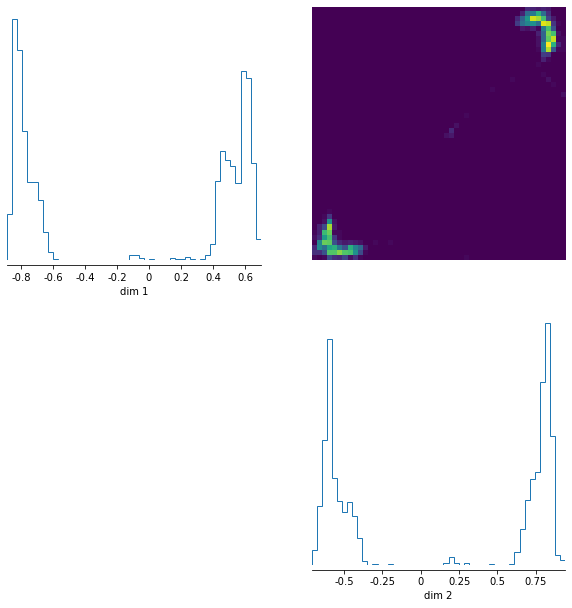

In [38]:
_ = pairplot(x.detach()[posterior._prior.support.check(x)])

## 2) Jensen–Shannon divergence 

This divergence is based on the forward and backward KL divergence, but now measures the divergence to the mean distribution M = (p-q)/2.
$$ D_{JS} = \frac{1}{2} D_{KL}(p(\theta|x)||M_\phi(\theta)) + \frac{1}{2} D_{KL}(M_\phi(\theta)||p(\theta|x)) = \frac{1}{2} \mathbb{E}_p \left[ \log \frac{p(\theta|x)}{0.5*(p(\theta|x) + q_\phi(\theta))}\right] + \frac{1}{2} \mathbb{E}_{q_\phi} \left[ \log \frac{0.5*(p(\theta|x) + q_\phi(\theta))}{p(\theta|x)}\right] $$
Should be intractable, we cannot get the mean density...

# 4) Evaluate mode collapse

The importance weights contain information about mode collapse, which can be used for evaluation.

In [8]:
inf, task = get_model("two_moons")

In [9]:
posterior_collapsed = inf.build_posterior()
posterior_collapsed.set_default_x(task.get_observation(1))
posterior_collapsed.train()

Loss: 1.35:  32%|███▏      | 649/2000 [00:35<01:13, 18.37it/s]
Converged with loss: 1.3200000524520874
Quality Score: 0.144 (smaller values are good, should be below 0.7, mode collapse may still occured.)


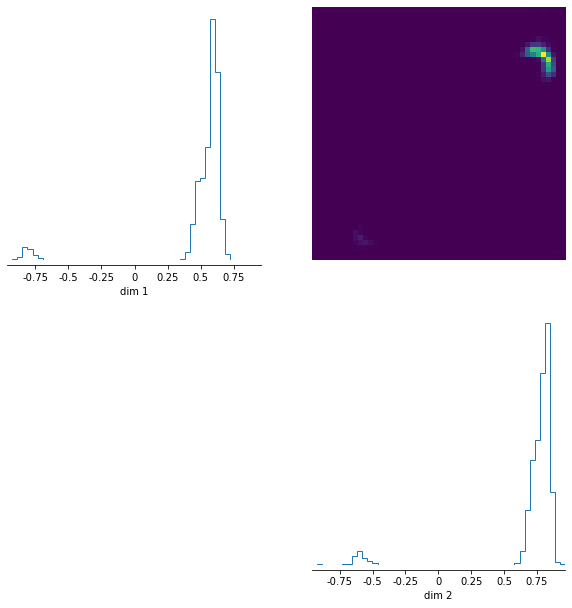

(<Figure size 720x720 with 4 Axes>,
 array([[<AxesSubplot:xlabel='dim 1'>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:xlabel='dim 2'>]], dtype=object))

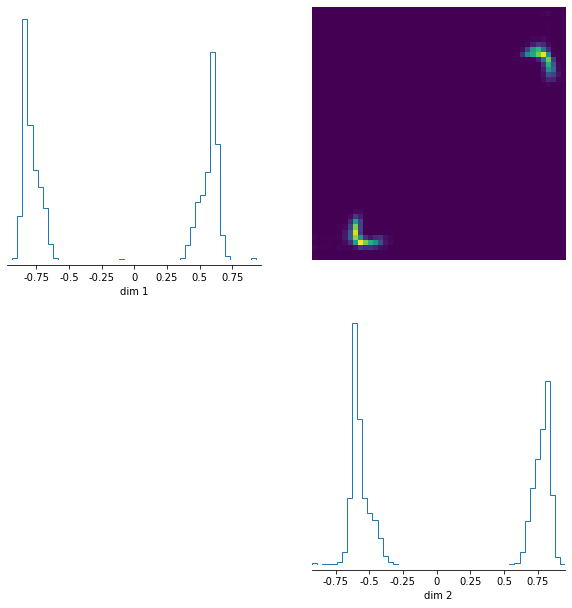

In [10]:
samples = posterior_collapsed.sample((10000,))
#plt.hexbin(samples[:,0], samples[:,1])
pairplot(samples)
plt.show()
samples = posterior.sample((10000,))
#plt.hexbin(samples[:,0], samples[:,1])
pairplot(samples)

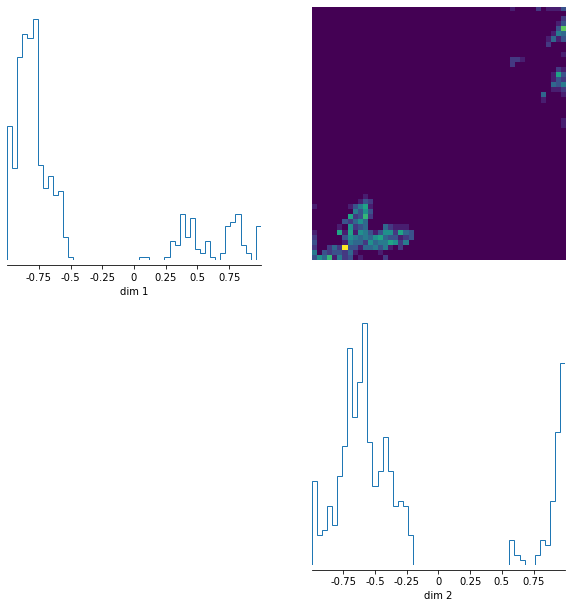

(<Figure size 720x720 with 4 Axes>,
 array([[<AxesSubplot:xlabel='dim 1'>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:xlabel='dim 2'>]], dtype=object))

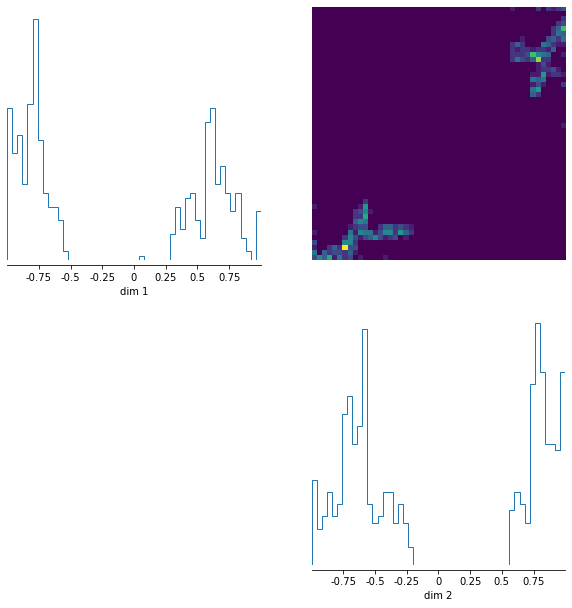

In [11]:
samples = posterior_collapsed._prior.sample((10000,))
x_obs = task.get_observation(1).repeat(10000,1)
ratio = posterior_collapsed.net.log_prob(x_obs, samples) + posterior_collapsed._prior.log_prob(samples)-posterior_collapsed.log_prob(samples)
weights, index = ratio.sort()
interesting = samples[index[-500:]]
#plt.hexbin(interesting[:,0], interesting[:,1])
pairplot(interesting)
plt.show()
ratio = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)-posterior.log_prob(samples)
weights2, index = ratio.sort()
interesting2 = samples[index[-500:]]
#plt.hexbin(interesting[:,0], interesting[:,1])
pairplot(interesting2)

In [23]:
weights.var()

tensor(7239.0088, grad_fn=<VarBackward0>)

In [17]:
posterior.log_prob(interesting2).mean()

tensor(-4.7342)

In [264]:
samples = posterior_collapsed.sample((500,))
hist1 = torch.histc(samples, min=-1, max=1, bins=100)
hist2 = torch.histc(interesting, min=-1, max=1, bins=100)
torch.sum(abs(hist1 - hist2))/2000

tensor(0.2840)

In [277]:
samples = posterior.sample((500,))
hist1 = torch.histc(samples, min=-1, max=1, bins=100)
hist2 = torch.histc(interesting2, min=-1, max=1, bins=100)
torch.sum(abs(hist1 - hist2))/2000

tensor(0.2260)

In [ ]:
torch.sum(hist1 + hist2)

In [280]:
weights = weights + weights.min().abs()
weights/= weights.max()

weights2 = weights2 + weights2.min().abs()
weights2/= weights2.max()

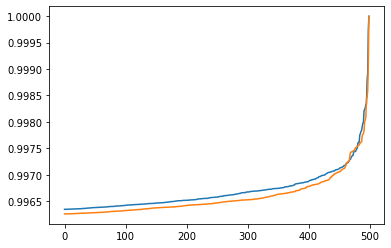

In [282]:
plt.plot(weights.detach()[-500:])
plt.plot(weights2.detach()[-500:])

In [283]:
from sbi.vi.paretto_smoothed_is import gpdfit 
gpdfit(weights.detach()[-100:])

(tensor(-4.8189), tensor(5.3622))

In [284]:
gpdfit(weights2.detach()[-100:])

(tensor(-4.8009), tensor(5.3423))